In [11]:
import os
import pickle
import itertools
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

import morph_analyses as m


%load_ext autoreload
%autoreload 2

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
sess.place_cell_info.keys()

dict_keys(['masks', 'SI', 'p'])

In [5]:
morphbin = np.linspace(-.11,1.11,num=11)
datadict = {}
for session_dict in (m.mouse_metadata.rare_sessions, m.mouse_metadata.frequent_sessions):

    for mouse, metadata in session_dict.items():
        datadict[mouse]={}

        for i, sess_deets in enumerate(metadata['test_sessions']):
            sess = m.sess.CA1MorphSession.from_nwb(mouse, 'testing', sess_deets['day'])
            datadict[mouse][i] = {
                'masks':sess.place_cell_info['masks'],
                'S_trial_mat': sess.trial_matrices['spks_norm'],
                'trial_info': sess.trial_info,
                'pvals': sess.place_cell_info['p']
                }

In [6]:
with open(m.params.data_dir / "place_cell_results.pkl","wb") as f:
    pickle.dump(datadict,f)
    

In [7]:
with open(m.params.data_dir / "place_cell_results.pkl","rb") as f:
    datadict = pickle.load(f)
    

In [17]:
def plot_all_place_cells(mice):
    getSort = lambda fr : np.argsort(np.argmax(fr,axis=1))
    pc_dict = {}
    for _m in [0,.25,.5,.75,1]:
        pc_dict[_m] = {}
        for mm in [0,.25,.5,.75,1]:
            pc_dict[_m][mm]=[]
            
    for mouse in mice: 
        for sess in datadict[mouse].keys():
            pvals = datadict[mouse][sess]['pvals']
            masks={}
            for k, p in pvals.items():
                masks[k] = pvals[k]<.05

            _pc_dict = m.place_cell_analysis.plot_placecells(
                m.utilities.trial_type_dict(datadict[mouse][sess]['S_trial_mat'],
                                            datadict[mouse][sess]['trial_info']['morphs']),
                masks,plot=False)
            for _m in _pc_dict.keys():
                for mm in _pc_dict.keys():
                    pc_dict[_m][mm].append(_pc_dict[_m][mm])
                    
    f,ax = plt.subplots(5,5,figsize=[5*5,7*5])
    f.subplots_adjust(wspace=.1,hspace=.1)
    for i,_m in enumerate(pc_dict.keys()):
        sort = getSort(np.concatenate(pc_dict[_m][_m],axis=0))
        for j,mm in enumerate(pc_dict.keys()):
            pc_dict[_m][mm] = np.concatenate(pc_dict[_m][mm],axis=0)
            print(pc_dict[_m][mm].shape)
            pc_dict[_m][mm] = pc_dict[_m][mm][sort,:]
            
            ax[i,j].imshow(pc_dict[_m][mm],aspect='auto',cmap='pink',vmin=.2,vmax=.9)
            if j>0:
                ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])

            if j==0:
                ax[i,j].set_ylabel(f'cells (sorted by S={_m})')
            ax[i,j].set_xlabel('Position')

            if i==0:
                ax[i,j].set_title(f'S={mm}')
    return f, ax


(11606, 45)
(11606, 45)
(11606, 45)
(11606, 45)
(11606, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(10608, 45)
(10608, 45)
(10608, 45)
(10608, 45)
(10608, 45)


Text(0.5, 0.98, 'Rare mice')

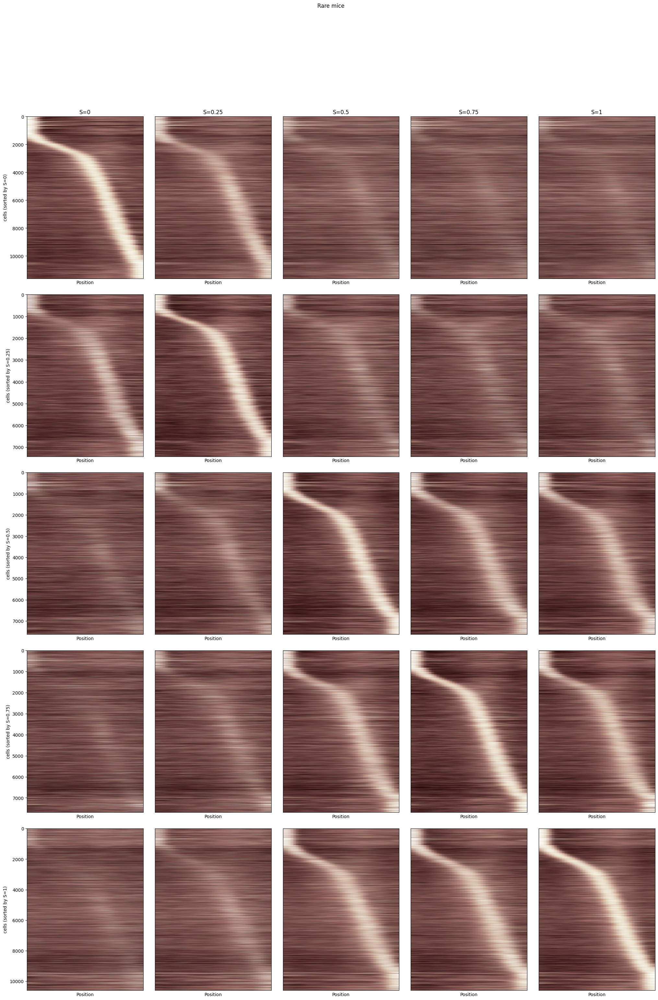

In [18]:
f, ax = plot_all_place_cells(m.mouse_metadata.rare_mice)
f.suptitle('Rare mice')

(5522, 45)
(5522, 45)
(5522, 45)
(5522, 45)
(5522, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5365, 45)
(5365, 45)
(5365, 45)
(5365, 45)
(5365, 45)


Text(0.5, 0.98, 'Frequent mice')

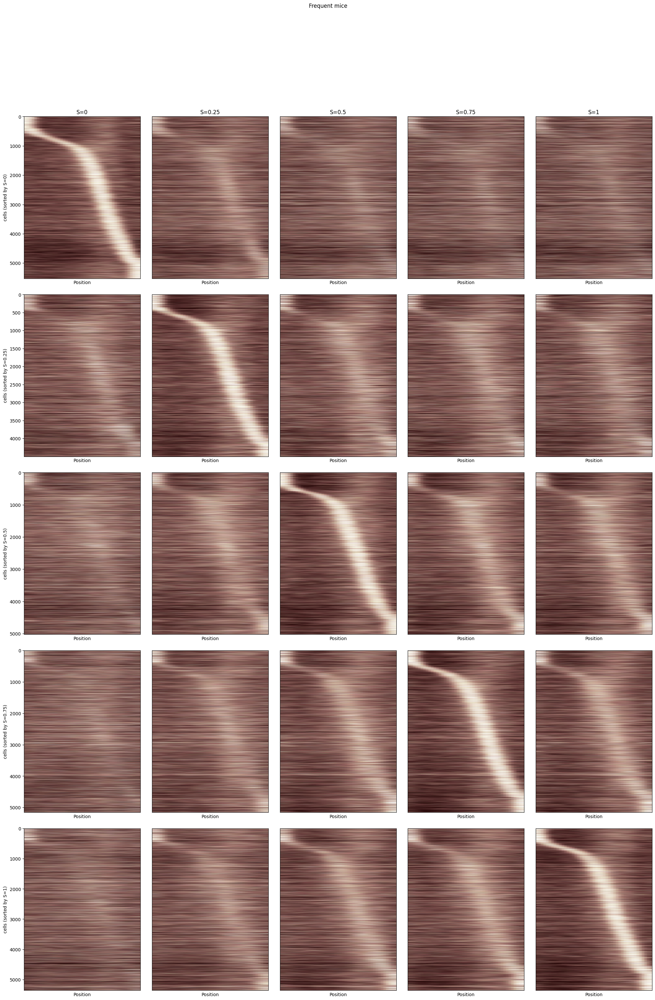

In [19]:
f, ax = plot_all_place_cells(m.mouse_metadata.frequent_mice)
f.suptitle('Frequent mice')

In [ ]:
mouselabel = []
rarefreqlabel = []
SM = []
SM_norm = []
sesslabel =[]
for mi, mouse in enumerate(mice):
    for si, (sess, sessdict) in enumerate(datadict[mouse].items()):
        # load data
        
        # OR mask
        for _i, (morph,mask) in enumerate(sessdict['masks'].items()):
            if _i == 0:
                ormask = mask
            else:
                ormask+=mask
        ormask = ormask>0
        
        # bin by morph value
        S_trial_mat = np.copy(sessdict['S_trial_mat'][:,:,ormask])
        S_binmat = np.zeros([5,*S_trial_mat.shape[1:]])
        for _i, m in enumerate(sessdict['masks'].keys()):
            S_binmat[_i,:,:] = S_trial_mat[sessdict['trial_info']['morphs']==m,:,:].mean(axis=0)
        S_binmat = S_binmat/np.linalg.norm(S_binmat,ord=2,axis=1,keepdims=True)

        # similarity matrix 
        sm = np.matmul(np.transpose(S_binmat,axes=(2,0,1)),np.transpose(S_binmat,axes=(2,1,0)))

        sm_norm = np.copy(sm)
        sm_norm[:,[0,1,2,3,4],[0,1,2,3,4]]=np.nan
        sm_norm = (sm_norm-np.nanmean(sm_norm))/np.nanstd(sm_norm)

        # save mouse and session index
        SM.append(sm)
        SM_norm.append(sm_norm)
        mouselabel.append(mi*np.ones((sm.shape[0],)))
        sesslabel.append(si*np.ones((sm.shape[0],)))
        if mi<5:
            rarefreqlabel.append(np.ones((sm.shape[0],)))
        else:
            rarefreqlabel.append(np.zeros((sm.shape[0],)))
    
SM = np.concatenate(SM,axis=0)
SM_norm = np.concatenate(SM_norm,axis=0)
mouselabel = np.concatenate(mouselabel)
rarefreqlabel = np.concatenate(rarefreqlabel)
sesslabel = np.concatenate(sesslabel)

In [85]:
# for each permutation of mouse labels
diff_perms = []
diff_perm_norm = []
iters =0
print(np.array(rare).sum())

for c, comb in enumerate(itertools.combinations(np.unique(mouselabel),6)):
    if c>0:
        rare_mask = np.zeros(mouselabel.shape)
        for _m_l  in comb:
#             print(_m_l)
            rare_mask += 1*(mouselabel==_m_l)
        rare_mask = rare_mask>0
#         print(SM.shape)
        diff_perms.append(SM[rare_mask,:,:].mean(axis=0)-SM[~rare_mask,:,:].mean(axis=0))
        diff_perm_norm.append(np.nanmean(SM_norm[rare_mask,:,:],axis=0)-np.nanmean(SM_norm[~rare_mask,:,:],axis=0))
print(c)
diff_perms = np.array(diff_perms)
print(diff_perms.shape)
diff_min,diff_max = np.percentile(diff_perms,2.5,axis=0),np.percentile(diff_perms,97.5,axis=0)
diff_perm_norm = np.array(diff_perm_norm)
# diff_min_norm,diff_max_norm = np.percentile(diff_perm_norm,.05,axis=0),np.percentile(diff_perm_norm,99.95,axis=0)
diff_min_norm,diff_max_norm = np.amin(diff_perm_norm,axis=0),np.amax(diff_perm_norm,axis=0)


5


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()


923
(923, 5, 5)


In [86]:
1./924

0.0010822510822510823

[[ 0.          0.00460178 -0.08382711 -0.08513677 -0.06349417]
 [ 0.00460178  0.         -0.11294024 -0.11721879 -0.09492437]
 [-0.08382711 -0.11294024  0.         -0.03603443 -0.01042723]
 [-0.08513677 -0.11721879 -0.03603443  0.         -0.00885283]
 [-0.06349417 -0.09492437 -0.01042723 -0.00885283  0.        ]]
diff [[        nan  0.44126447 -0.08595379 -0.06976115  0.08398885]
 [ 0.44126447         nan -0.38849508 -0.39871866 -0.24109963]
 [-0.08595379 -0.38849508         nan  0.10359408  0.279824  ]
 [-0.06976115 -0.39871866  0.10359408         nan  0.27535691]
 [ 0.08398885 -0.24109963  0.279824    0.27535691         nan]]
min [[        nan -0.45598474 -0.3316578  -0.3991713  -0.28099762]
 [-0.45598474         nan -0.38591607 -0.39694804 -0.25961221]
 [-0.3316578  -0.38591607         nan -0.27693893 -0.4244851 ]
 [-0.3991713  -0.39694804 -0.27693893         nan -0.35091575]
 [-0.28099762 -0.25961221 -0.4244851  -0.35091575         nan]]
max [[       nan 0.43975406 0.3316578  0.39

C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: Mean of empty slice
  
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater


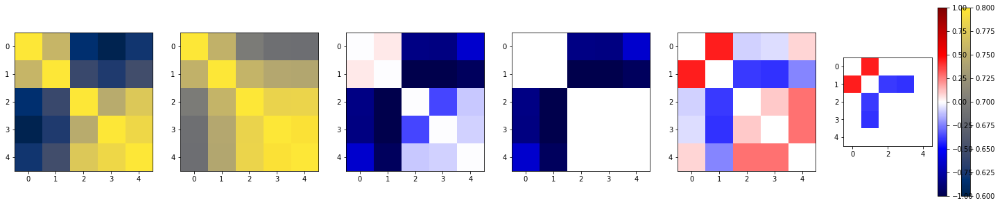

In [ ]:
f,ax = plt.subplots(1,6,figsize= [25,5])
muf,mur = SM[rarefreqlabel==0,:,:].mean(axis=0),SM[rarefreqlabel==1,:,:].mean(axis=0)
diff = mur-muf
im=ax[0].imshow(mur,cmap='cividis',vmin=.6,vmax=.8)
f.colorbar(im)
ax[1].imshow(muf,cmap='cividis',vmin=.6,vmax=.8)
ax[2].imshow(diff,cmap='seismic',vmin=-.1,vmax=.1)
print(diff)
mask = ((diff>diff_max) + (diff<diff_min))>0
diff[~mask]=np.nan
ax[3].imshow(diff,cmap='seismic',vmin=-.1,vmax=.1)


muf,mur = np.nanmean(SM_norm[rarefreqlabel==0,:,:],axis=0),np.nanmean(SM_norm[rarefreqlabel==1,:,:],axis=0)
diff = mur-muf
print('diff',diff)
print('min',diff_min_norm)
print('max',diff_max_norm)
mask = ((diff<diff_min_norm) + (diff>diff_max_norm))>0
print(mask)
# diff[~mask]=np.nan
im=ax[4].imshow(diff,cmap='seismic',vmin=-1,vmax=1)

# t,p = sp.stats.ttest_ind(SM[rarefreqlabel==0,:],SM[rarefreqlabel==1,:],axis=0)
# mask = p<.005
# diff = muf-mur
diff[~mask]=np.nan
im = ax[5].imshow(diff,cmap='seismic',vmin=-1,vmax=1)
f.colorbar(im)


In [17]:
# numbers for main text

num = 0
den = 0
orcount = 0
andcount = 0 
count0,count1 = 0,0
for mouse in rare_mice: 
    print(mouse)
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        allmask = masks[0]
        
        orcount += (masks[0]|masks[1]).sum()
        andcount += (masks[0]&masks[1]).sum()
        count0+= masks[0].sum()
        count1+=masks[1].sum()
        print(allmask.shape)
        for k,mask in masks.items():
            allmask = allmask|mask
        
        num += allmask.sum()
        den += allmask.shape[0]
print("Total number of place cells: %f" % num,"Pecent: %f" % (num/den))
print("0 pcnt %f" % (count0/den),"1 pcnt %f" % (count1/den),"random ovlp %f" % (count0/den*count1/den),"actual ovlp %f" %(andcount/den))
# print("0 pcnt %f" % (count0/num),"1 pcnt %f" % (count1/num),"random ovlp %f" % (count0/num*count1/num),"actual ovlp %f" %(andcount/num))

4139265.3
(1828,)
(1904,)
(1817,)
(1708,)
(1715,)
4139265.4
(1632,)
(1656,)
(1515,)
(1650,)
(1498,)
(1631,)
4139265.5
(915,)
(976,)
(984,)
(932,)
(1047,)
4222168.1
(919,)
(1035,)
(1074,)
(940,)
4343703.1
(1194,)
4343706
(71,)
(2336,)
(2652,)
(1403,)
(1617,)
Total number of place cells: 15847.000000 Pecent: 0.432399
0 pcnt 0.228246 1 pcnt 0.209092 random ovlp 0.047724 actual ovlp 0.060547


In [18]:
.2285*.2094

0.047847900000000006

In [19]:
# numbers for main text

num = 0
den = 0
orcount = 0
andcount = 0 
count0,count1 = 0,0
for mouse in freq_mice: 
    print(mouse)
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        allmask = masks[0]
        
        orcount += (masks[0]|masks[1]).sum()
        andcount += (masks[0]&masks[1]).sum()
        count0+= masks[0].sum()
        count1+=masks[1].sum()
        print(allmask.shape)
        for k,mask in masks.items():
            allmask = allmask|mask
        
        num += allmask.sum()
        den += allmask.shape[0]
print("Total number of place cells: %f" % num,"Pecent: %f" % (num/den))
print("0 pcnt %f" % (count0/den),"1 pcnt %f" % (count1/den),"random ovlp %f" % (count0/den*count1/den),"actual ovlp %f" %(andcount/den))

4222153.1
(301,)
(273,)
(237,)
4222153.2
(2127,)
(2149,)
(2046,)
(2006,)
4222153.3
(161,)
4222174.1
(1963,)
(1998,)
(2047,)
(2117,)
(1901,)
4222154.1
(309,)
(571,)
(326,)
(311,)
(257,)
4343702.1
(3313,)
(2875,)
(2746,)
Total number of place cells: 8933.000000 Pecent: 0.297430
0 pcnt 0.107844 1 pcnt 0.098222 random ovlp 0.010593 actual ovlp 0.019778


[[], [], [], [], [], [], [], [], [], [], [], []]
4139265.3 [0.17231947483588622, 0.15336134453781514, 0.15244909190974132, 0.2189695550351288, 0.18483965014577258]
4139265.4 [0.2028186274509804, 0.2222222222222222, 0.21848184818481847, 0.17757575757575758, 0.18891855807743657, 0.17290006131207847]
4139265.5 [0.2262295081967213, 0.2489754098360656, 0.25914634146341464, 0.22532188841201717, 0.20630372492836677]
4222168.1 [0.3928182807399347, 0.28502415458937197, 0.3808193668528864, 0.4106382978723404]
4343703.1 [0.2638190954773869]
4343706 [0.09859154929577464, 0.2529965753424658, 0.21116138763197587, 0.2615823235923022, 0.29684601113172543]
4222153.1 [0.053156146179401995, 0.08424908424908426, 0.05063291139240506]
4222153.2 [0.09685002350728726, 0.12238250348999535, 0.14271749755620725, 0.13858424725822532]
4222153.3 [0.08695652173913043]
4222174.1 [0.13499745287824758, 0.15265265265265265, 0.2554958475818271, 0.09730751062824752, 0.1693845344555497]
4222154.1 [0.03559870550161812, 0.03

[Text(0, 0, 'R1'),
 Text(0, 0, 'R2'),
 Text(0, 0, 'R3'),
 Text(0, 0, 'R4'),
 Text(0, 0, 'R5'),
 Text(0, 0, 'R6'),
 Text(0, 0, 'F1'),
 Text(0, 0, 'F2'),
 Text(0, 0, 'F3'),
 Text(0, 0, 'F4'),
 Text(0, 0, 'F5'),
 Text(0, 0, 'F6')]

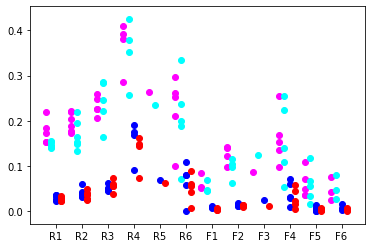

In [22]:
# numbers for main text

count0,count1 = [[]]*len(mice),[[]]*len(mice)
print(count0)
randovlp,actlovlp= [[]]*len(mice),[[]]*len(mice)
randovlp_all,actlovlp_all = [],[]
for m,mouse in enumerate(mice): 
#     
    count0[m],count1[m],randovlp[m],actlovlp[m]=[],[],[],[]
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        
        count0[m].append(masks[0].mean())
#         print(m,masks[0].mean())
        count1[m].append(masks[1].mean())
        randovlp[m].append(masks[0].mean()*masks[1].mean())
        actlovlp[m].append((masks[0]&masks[1]).mean())
        
        randovlp_all.append(masks[0].mean()*masks[1].mean())
        actlovlp_all.append((masks[0]&masks[1]).mean())
    print(mouse,count0[m])

print(count0[2])
f, ax = plt.subplots()
for m in range(len(mice)):
#     print(len(count0[m]))
#     jit = .3*(np.random.rand()-.5)
    ax.scatter(m*np.ones([len(count0[m]),])-.4,count0[m],color=plt.cm.cool(1.))
    ax.scatter(m*np.ones([len(count1[m]),])-.2,count1[m],color=plt.cm.cool(0.))
    ax.scatter(m*np.ones([len(count1[m]),])+0,actlovlp[m],color='blue')
    ax.scatter(m*np.ones([len(count1[m]),])+.2,randovlp[m],color='red')

ax.set_xticks(np.arange(len(mice)))
ax.set_xticklabels(['R1','R2','R3','R4','R5','R6','F1','F2','F3','F4','F5','F6'])
# f.savefig("D:\\Morph_Results\\figures\\pc_fracs.pdf",format="pdf")

47
160.0 1.909725445431717e-05
-4.867154257689973 1.3709071349721284e-05
-4.867154257689973 1.3709071349721284e-05


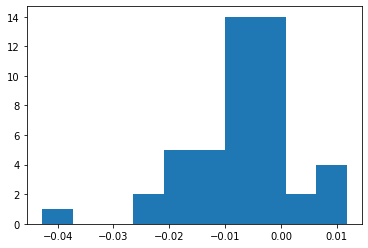

In [33]:
f,ax = plt.subplots()
print(len(randovlp_all))
ax.hist(np.array(randovlp_all)-np.array(actlovlp_all))
# print(np.array(randovlp_all).mean())
stat,p = sp.stats.wilcoxon(np.array(randovlp_all)-np.array(actlovlp_all))
print(stat,p)
t,p = sp.stats.ttest_rel(np.array(randovlp_all),np.array(actlovlp_all))
print(t,p)
t,p = sp.stats.ttest_1samp(np.array(randovlp_all)-np.array(actlovlp_all),0)
print(t,p)

(45, 2219)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)
(2219, 45)


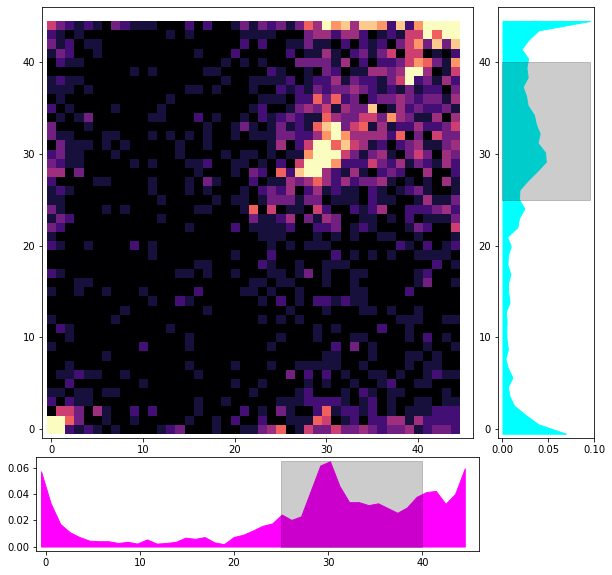

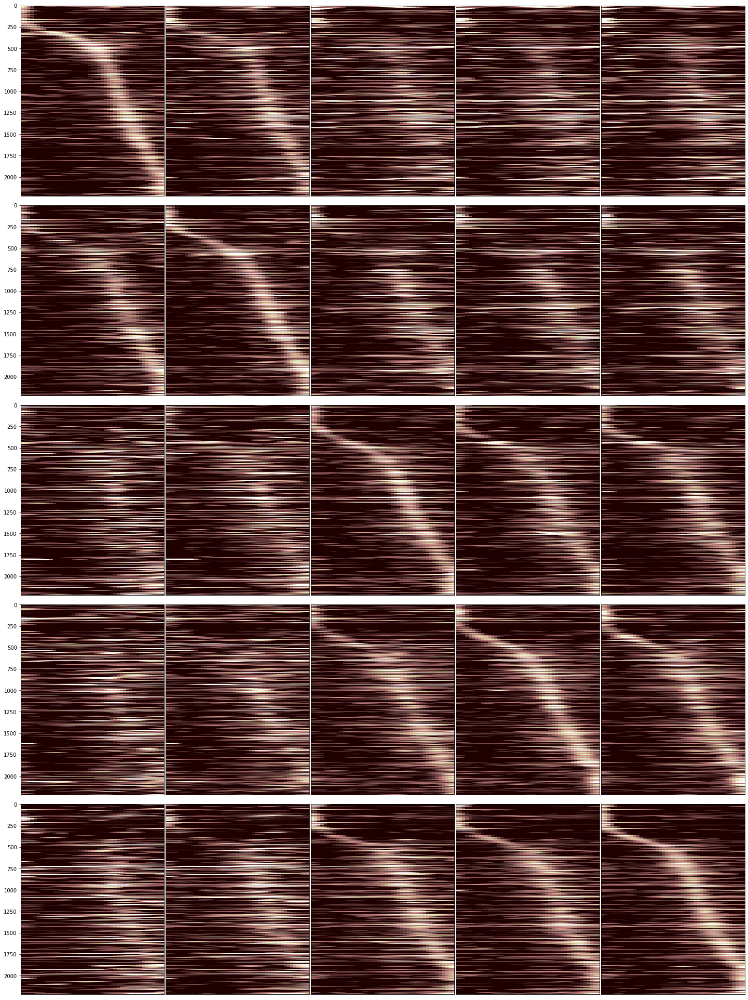

In [85]:
pc_dict = {}
for m in [0,.25,.5,.75,1]:
    pc_dict[m] = {}
    for mm in [0,.25,.5,.75,1]:
        pc_dict[m][mm]=[]
        
comm0,comm1 = [],[]
for mouse in rare_mice: #datadict.keys():
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        mask = (pvals[0]<.05) & (pvals[1]<.05)
        for k, p in pvals.items():
            masks[k]=mask
        
        
        pcs = datadict[mouse][sess]['S_trial_mat'][:,:,mask]
        comm0.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==0,:,:],axis=0))
        comm1.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==1,:,:],axis=0))
        
        _pc_dict = pc.plot_placecells(u.trial_type_dict(datadict[mouse][sess]['S_trial_mat'],datadict[mouse][sess]['trial_info']['morphs']),masks,plot=False)
        for m in _pc_dict.keys():
            for mm in _pc_dict.keys():
                pc_dict[m][mm].append(_pc_dict[m][mm])
                
comm0 = np.concatenate(comm0,axis=-1)
comm1 = np.concatenate(comm1,axis=-1)
print(comm0.shape)
       

f,ax = pc.common_cell_remap_heatmap(comm0,comm1,norm=False)
f.savefig("D:\\Morph_Results\\figures\\rare_common_pc_heatmap.pdf",format="pdf")
                
f,ax = plt.subplots(5,5,figsize=[5*5,7*5])
f.subplots_adjust(wspace=.01,hspace=.05)
for i,m in enumerate(pc_dict.keys()):
    sort = getSort(np.concatenate(pc_dict[m][m],axis=0))
    for j,mm in enumerate(pc_dict.keys()):
        pc_dict[m][mm] = np.concatenate(pc_dict[m][mm],axis=0)
        print(pc_dict[m][mm].shape)
        pc_dict[m][mm] = pc_dict[m][mm][sort,:]
        
        ax[i,j].imshow(pc_dict[m][mm],aspect='auto',cmap='pink',vmin=.2,vmax=.9)
        if j>0:
            ax[i,j].set_yticks([])
        ax[i,j].set_xticks([])
        
f.savefig("D:\\Morph_Results\\figures\\rare_common_pc.pdf",format="pdf")

(45, 594)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)
(594, 45)


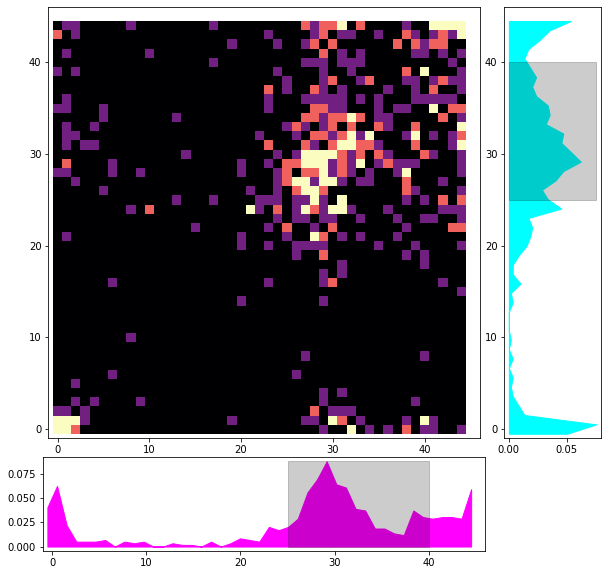

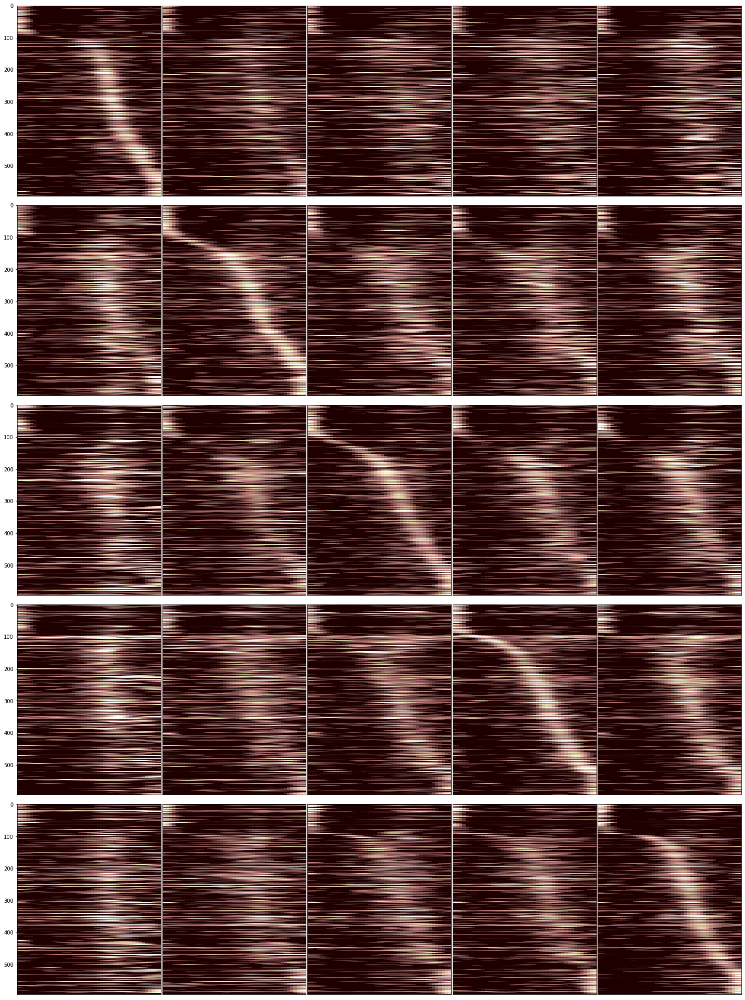

In [86]:
pc_dict = {}
for m in [0,.25,.5,.75,1]:
    pc_dict[m] = {}
    for mm in [0,.25,.5,.75,1]:
        pc_dict[m][mm]=[]
        
comm0,comm1 = [],[]
for mouse in freq_mice: #datadict.keys():
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        mask = (pvals[0]<.05) & (pvals[1]<.05)
        for k, p in pvals.items():
            masks[k]=mask
        
        
        pcs = datadict[mouse][sess]['S_trial_mat'][:,:,mask]
        comm0.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==0,:,:],axis=0))
        comm1.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==1,:,:],axis=0))
        
        _pc_dict = pc.plot_placecells(u.trial_type_dict(datadict[mouse][sess]['S_trial_mat'],datadict[mouse][sess]['trial_info']['morphs']),masks,plot=False)
        for m in _pc_dict.keys():
            for mm in _pc_dict.keys():
                pc_dict[m][mm].append(_pc_dict[m][mm])
                
comm0 = np.concatenate(comm0,axis=-1)
comm1 = np.concatenate(comm1,axis=-1)
print(comm0.shape)
       

f,ax = pc.common_cell_remap_heatmap(comm0,comm1,norm=False)
f.savefig("D:\\Morph_Results\\figures\\freq_common_pc_heatmap.pdf",format="pdf")
                
f,ax = plt.subplots(5,5,figsize=[5*5,7*5])
f.subplots_adjust(wspace=.01,hspace=.05)
for i,m in enumerate(pc_dict.keys()):
    sort = getSort(np.concatenate(pc_dict[m][m],axis=0))
    for j,mm in enumerate(pc_dict.keys()):
        pc_dict[m][mm] = np.concatenate(pc_dict[m][mm],axis=0)
        print(pc_dict[m][mm].shape)
        pc_dict[m][mm] = pc_dict[m][mm][sort,:]
        
        ax[i,j].imshow(pc_dict[m][mm],aspect='auto',cmap='pink',vmin=.2,vmax=.9)
        if j>0:
            ax[i,j].set_yticks([])
        ax[i,j].set_xticks([])
        
f.savefig("D:\\Morph_Results\\figures\\freq_common_pc.pdf",format="pdf")